# **Turbofan Health Monitoring and Predictive Maintenance**


In [1]:
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import os

# Mount Google Drive (if your dataset is stored there)
drive.mount('/content/drive')

Mounted at /content/drive


Load the Dataset

In [2]:


# Define file paths
train_file = '/content/drive/MyDrive/Dataset_Turbo_fan/CMAPSSData/train_FD001.txt'
test_file = '/content/drive/MyDrive/Dataset_Turbo_fan/CMAPSSData/test_FD001.txt'
rul_file = '/content/drive/MyDrive/Dataset_Turbo_fan/CMAPSSData/RUL_FD001.txt'

# Check if files exist
for file_path in [train_file, test_file, rul_file]:
    if not os.path.exists(file_path):
        print(f"File not found: {file_path}")
        raise FileNotFoundError(f"Ensure that the file exists at the specified path: {file_path}")

# Define new column names for the dataset
columns = [
    'unit_number',             # Column 1: Unit number
    'timestamp',               # Column 2: Timestamp
    'operational_setting_1',   # Column 3: Operational setting 1
    'operational_setting_2',   # Column 4: Operational setting 2
    'operational_setting_3',   # Column 5: Operational setting 3
    'sensor_measurement_1',    # Column 6: Sensor 1
    'sensor_measurement_2',    # Column 7: Sensor 2
    'sensor_measurement_3',    # Column 8: Sensor 3
    'sensor_measurement_4',    # Column 9: Sensor 4
    'sensor_measurement_5',    # Column 10: Sensor 5
    'sensor_measurement_6',    # Column 11: Sensor 6
    'sensor_measurement_7',    # Column 12: Sensor 7
    'sensor_measurement_8',    # Column 13: Sensor 8
    'sensor_measurement_9',    # Column 14: Sensor 9
    'sensor_measurement_10',   # Column 15: Sensor 10
    'sensor_measurement_11',   # Column 16: Sensor 11
    'sensor_measurement_12',   # Column 17: Sensor 12
    'sensor_measurement_13',   # Column 18: Sensor 13
    'sensor_measurement_14',   # Column 19: Sensor 14
    'sensor_measurement_15',   # Column 20: Sensor 15
    'sensor_measurement_16',   # Column 21: Sensor 16
    'sensor_measurement_17',   # Column 22: Sensor 17
    'sensor_measurement_18',   # Column 23: Sensor 18
    'sensor_measurement_19',   # Column 24: Sensor 19
    'sensor_measurement_20',   # Column 25: Sensor 20
    'sensor_measurement_21'    # Column 26: Sensor 21
]

# Load datasets
try:
    train_data = pd.read_csv(train_file, sep=r'\s+', header=None, names=columns)
    test_data = pd.read_csv(test_file, sep=r'\s+', header=None, names=columns)
    rul_data = pd.read_csv(rul_file, header=None, names=['RUL'])
    print("Datasets loaded successfully!")
except Exception as e:
    print(f"Error loading datasets: {e}")
    raise

# Display basic information about datasets
print("Training Data Info:")
print(train_data.info())

print("\nTest Data Info:")
print(test_data.info())

print("\nRUL Data Preview:")
print(rul_data.head())

# Optionally, check for missing values in datasets
print("\nMissing Values in Training Data:")
print(train_data.isnull().sum())
print("\nMissing Values in Test Data:")
print(test_data.isnull().sum())
print("\nMissing Values in RUL Data:")
print(rul_data.isnull().sum())


Datasets loaded successfully!
Training Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   unit_number            20631 non-null  int64  
 1   timestamp              20631 non-null  int64  
 2   operational_setting_1  20631 non-null  float64
 3   operational_setting_2  20631 non-null  float64
 4   operational_setting_3  20631 non-null  float64
 5   sensor_measurement_1   20631 non-null  float64
 6   sensor_measurement_2   20631 non-null  float64
 7   sensor_measurement_3   20631 non-null  float64
 8   sensor_measurement_4   20631 non-null  float64
 9   sensor_measurement_5   20631 non-null  float64
 10  sensor_measurement_6   20631 non-null  float64
 11  sensor_measurement_7   20631 non-null  float64
 12  sensor_measurement_8   20631 non-null  float64
 13  sensor_measurement_9   20631 non-null  float64
 14  sens

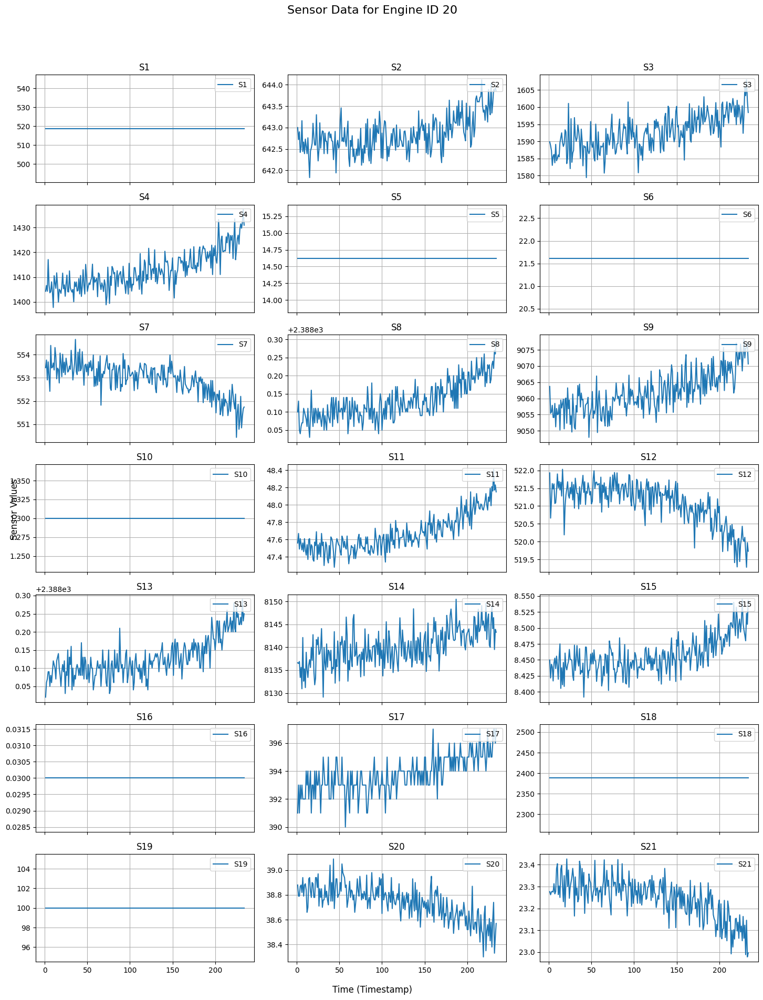

In [3]:


# Example: Replace 'train_data' with your loaded dataset
# Assuming 'train_data' contains the loaded training dataset

# Select a specific engine's data (similar to MATLAB's rawTrain.X{1})
engine_id = 20  # Replace with the desired engine ID
engine_data = train_data[train_data['unit_number'] == engine_id]

# Select only sensor data columns (Columns 6–26 in the dataset)
sensor_columns = [col for col in train_data.columns if col.startswith('sensor_measurement_')]

# Create a figure with 3 columns of subplots
n_sensors = len(sensor_columns)
n_cols = 3
n_rows = (n_sensors + n_cols - 1) // n_cols  # Calculate required rows for 3 columns

fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 20), sharex=True)
axs = axs.flatten()  # Flatten for easier iteration

# Plot each sensor in its respective subplot
for i, col in enumerate(sensor_columns):
    label = f"S{i+1}" if col == 'sensor_measurement_1' else f"S{i+1}"  # Rename column
    axs[i].plot(engine_data['timestamp'], engine_data[col], label=label)
    axs[i].set_title(label)
    axs[i].legend(loc='upper right')
    axs[i].grid()

# Hide any empty subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

fig.suptitle(f'Sensor Data for Engine ID {engine_id}', fontsize=16)
fig.text(0.5, 0.04, 'Time (Timestamp)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Sensor Values', va='center', rotation='vertical', fontsize=12)
plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()



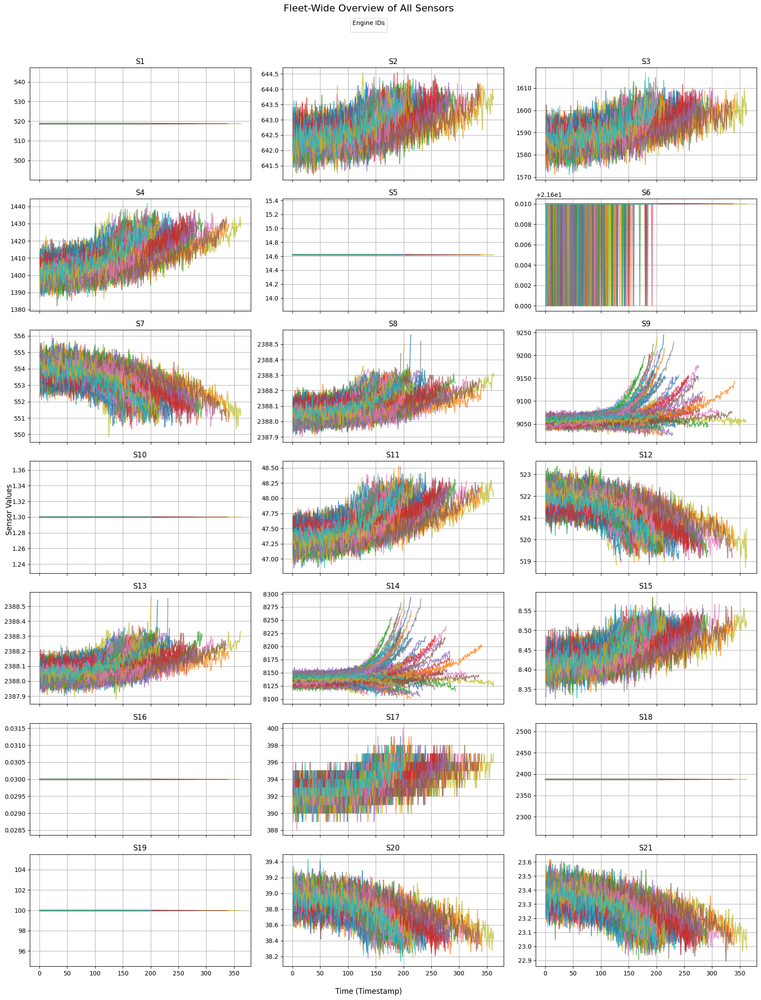

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Example: Replace 'train_data' with your loaded dataset
# Assuming 'train_data' contains the loaded training dataset

# Select only sensor data columns (Columns 6–26 in the dataset)
sensor_columns = [col for col in train_data.columns if col.startswith('sensor_measurement_')]

# Number of sensors
n_sensors = len(sensor_columns)

# Create a figure with 3 columns of subplots
n_cols = 3
n_rows = (n_sensors + n_cols - 1) // n_cols  # Calculate required rows for 3 columns

fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 24), sharex=True, sharey=False)
axs = axs.flatten()  # Flatten for easier iteration

# Plot each sensor's fleet-wide data in its respective subplot
for i, sensor in enumerate(sensor_columns):
    for engine_id in train_data['unit_number'].unique():
        # Filter data for the current engine
        engine_data = train_data[train_data['unit_number'] == engine_id]

        # Plot the sensor data against timestamp
        axs[i].plot(engine_data['timestamp'], engine_data[sensor], alpha=0.7)

    # Set subplot title and labels
    axs[i].set_title(sensor.replace('sensor_measurement_', 'S'), fontsize=12)
    axs[i].grid()

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    axs[j].axis('off')

# Add global labels and title
fig.suptitle('Fleet-Wide Overview of All Sensors', fontsize=16)
fig.text(0.5, 0.04, 'Time (Timestamp)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Sensor Values', va='center', rotation='vertical', fontsize=12)

# Add legend only once (for the first subplot)
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.97), ncol=8, title='Engine IDs', fontsize=10)

plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()


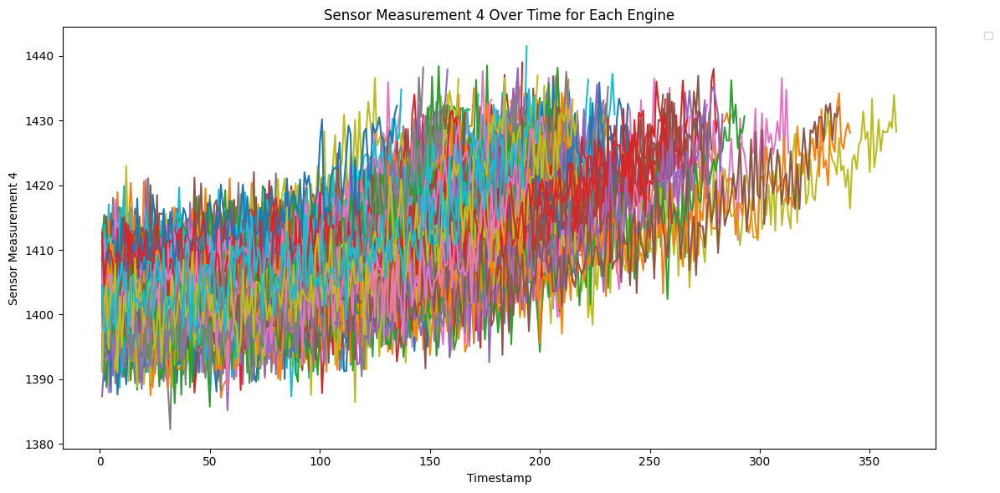

In [5]:
import matplotlib.pyplot as plt

# Select the column to plot
column_to_plot = 'sensor_measurement_4'

# Group data by unit_number (engine ID)
grouped_data = train_data.groupby('unit_number')

# Plot data for each engine
plt.figure(figsize=(12, 6))
for engine_id, engine_data in grouped_data:
    plt.plot(engine_data['timestamp'], engine_data[column_to_plot])

# Add labels and title
plt.xlabel('Timestamp')
plt.ylabel(column_to_plot.replace('_', ' ').title())
plt.title(f'{column_to_plot.replace("_", " ").title()} Over Time for Each Engine')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', ncol=2)
plt.tight_layout()
plt.show()



Compute RUL for Training

In [6]:
# Compute RUL for training data
# RUL is calculated as the difference between the maximum timestamp of an engine and its current timestamp
train_data['RUL'] = train_data.groupby('unit_number')['timestamp'].transform('max') - train_data['timestamp']

# Add the last cycle (timestamp) for each engine in the test dataset
last_cycle = test_data.groupby('unit_number')['timestamp'].max().reset_index()
last_cycle.columns = ['unit_number', 'last_cycle']

# Merge the last cycle information with the test data, avoiding column collision
test_data = test_data.merge(last_cycle, on='unit_number', suffixes=('', '_y'))

# Merge the RUL information from the RUL file, ensuring no index conflicts
rul_data.index.name = 'unit_number'  # Set the index name for proper merging
test_data = test_data.merge(rul_data, on='unit_number', suffixes=('', '_y'))

# Compute the actual RUL for each row in the test data
test_data['RUL'] = test_data['RUL'] + (test_data['last_cycle'] - test_data['timestamp'])

# Clean up unnecessary duplicate columns if created during merge
test_data = test_data.loc[:, ~test_data.columns.str.endswith('_y')]




**General analysis**


Basic statistical analysis of both df_X and df_y datasets are shown below:

In [7]:
train_data.describe()

,unit_number,timestamp,operational_setting_1,operational_setting_2,operational_setting_3,sensor_measurement_1,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_5,...,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_16,sensor_measurement_17,sensor_measurement_18,sensor_measurement_19,sensor_measurement_20,sensor_measurement_21,RUL
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,...,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,...,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705,107.807862
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,...,0.071919,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251,68.880990
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,...,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200,0.000000
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,...,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800,51.000000
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,...,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900,103.000000
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,...,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800,155.000000
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,...,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400,361.000000


**Analysis of NaN**

It will be checked whether there are NaN in the working datasets

In [8]:
#Check number of NaN in the df_X dataset
train_data.isna().sum().sum()

#Check number of NaN in the df_X dataset
test_data.isna().sum().sum()

0

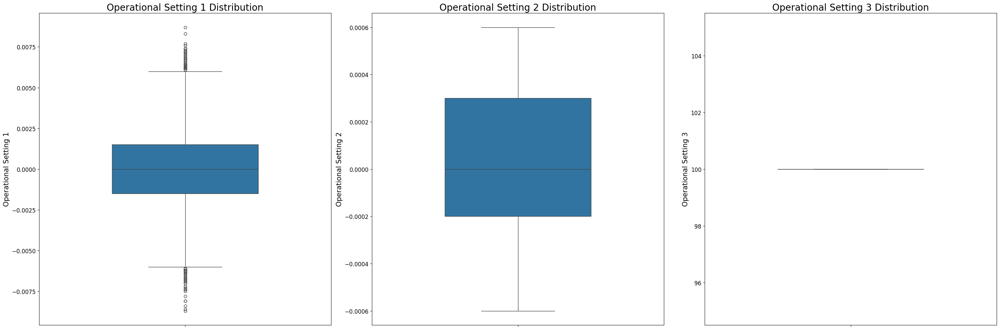

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a 1x3 array of subplots for operational conditions
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 10))

# Operational Setting 1
sns.boxplot(y='operational_setting_1', data=train_data, width=0.5, ax=axes[0])
axes[0].set_ylabel('Operational Setting 1', fontsize=15)
axes[0].set_title('Operational Setting 1 Distribution', fontsize=20)
axes[0].tick_params(labelsize=12)

# Operational Setting 2
sns.boxplot(y='operational_setting_2', data=train_data, width=0.5, ax=axes[1])
axes[1].set_ylabel('Operational Setting 2', fontsize=15)
axes[1].set_title('Operational Setting 2 Distribution', fontsize=20)
axes[1].tick_params(labelsize=12)

# Operational Setting 3
sns.boxplot(y='operational_setting_3', data=train_data, width=0.5, ax=axes[2])
axes[2].set_ylabel('Operational Setting 3', fontsize=15)
axes[2].set_title('Operational Setting 3 Distribution', fontsize=20)
axes[2].tick_params(labelsize=12)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()




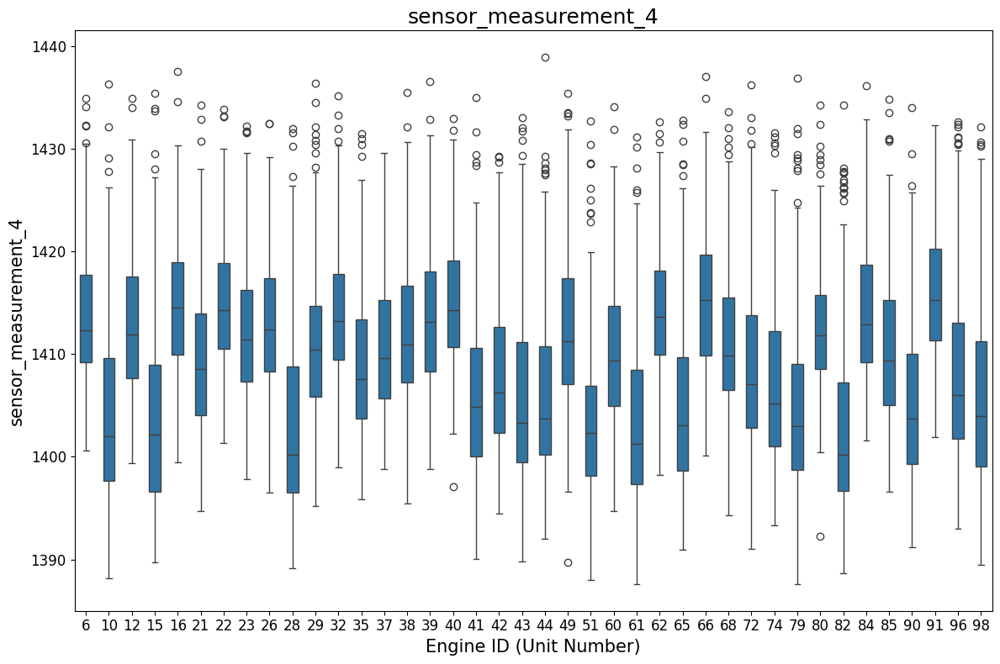

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import random

# Select the column to plot
sensor_column = 'sensor_measurement_4'  # Replace with any sensor column as needed

# Randomly sample 10 engine IDs (unit_number in your dataset)
random_engines = random.sample(train_data['unit_number'].unique().tolist(), 40)

# Filter data for the selected engines
filtered_data = train_data[train_data['unit_number'].isin(random_engines)]

# Create the boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(x='unit_number', y=sensor_column, data=filtered_data, width=0.5)

# Customize plot labels and title
plt.xlabel('Engine ID (Unit Number)', fontsize=15)
plt.ylabel(sensor_column, fontsize=15)
plt.title(sensor_column, fontsize=18)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()



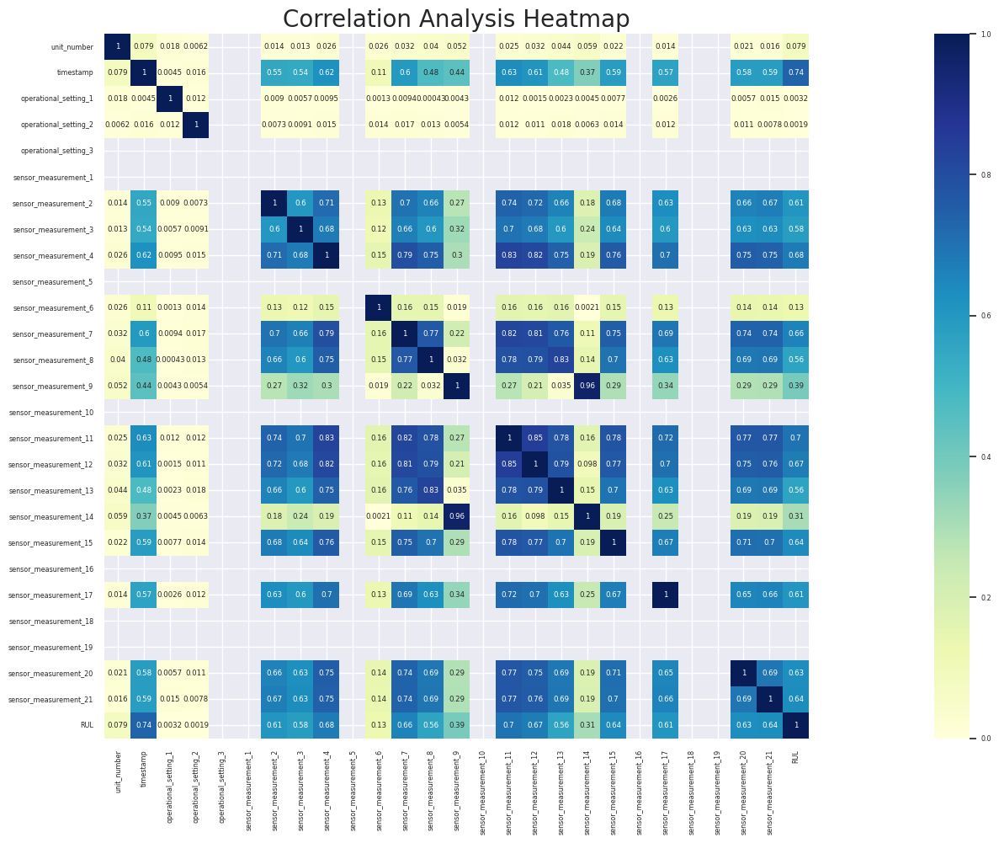

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Compute the correlation matrix
correlation_matrix = train_data.corr()

# Plot the correlation heatmap
plt.figure(figsize=(30, 10))  # Adjust the size as needed
sns.set(font_scale=0.52)  # Adjust font scale for better readability
sns.heatmap(
    np.abs(correlation_matrix),  # Take absolute values to show positive and negative correlations similarly
    vmin=0, vmax=1,              # Scale from 0 to 1
    cmap="YlGnBu",               # Use the YlGnBu colormap
    annot=True,                  # Annotate the heatmap with correlation values
    square=True                  # Ensure heatmap squares are square-shaped
)

# Add title
plt.title("Correlation Analysis Heatmap", fontsize=20)
plt.tight_layout()
plt.show()


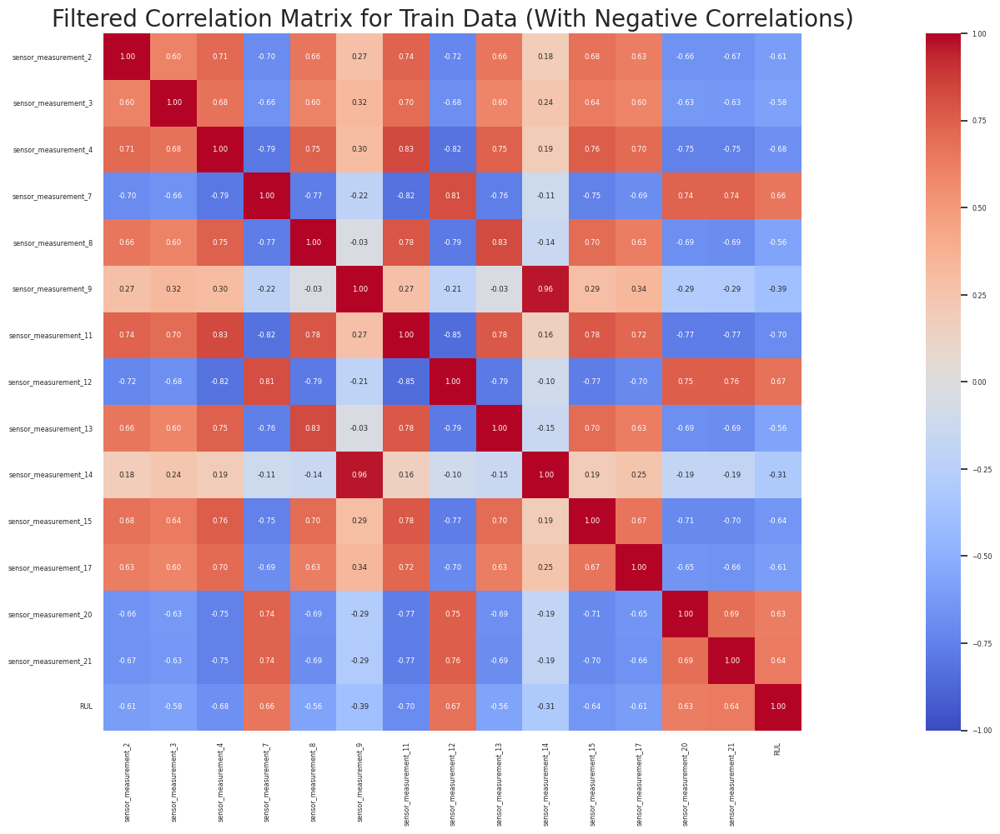

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Function to remove constant or nearly constant columns
def remove_constant_columns(df, threshold=1e-5):
    """
    Remove columns where the variance is below a threshold (essentially constant or nearly constant values).
    """
    return df.loc[:, df.var() > threshold]

# Remove constant or non-meaningful columns from the training data
filtered_train_data = remove_constant_columns(train_data)

# Define columns to exclude from the correlation calculation
columns_to_exclude = ['unit_number', 'timestamp']

# Compute the correlation matrix for columns not in `columns_to_exclude`
columns_for_correlation = [col for col in filtered_train_data.columns if col not in columns_to_exclude]
filtered_correlation_matrix = filtered_train_data[columns_for_correlation].corr()

# Plot the filtered correlation heatmap with actual correlation values (positive and negative)
plt.figure(figsize=(30, 10))  # Adjust the size as needed
sns.set(font_scale=0.52)  # Adjust font scale for better readability
sns.heatmap(
    filtered_correlation_matrix,  # Use the actual correlation matrix without absolute values
    vmin=-1, vmax=1,              # Scale from -1 to 1 to include negative correlations
    cmap="coolwarm",              # Use the coolwarm colormap to show both negative and positive correlations
    annot=True,                   # Annotate the heatmap with correlation values
    fmt=".2f",                    # Format the annotations with two decimal places
    cbar=True,                    # Show color bar
    square=True                   # Ensure heatmap squares are square-shaped
)

# Add title
plt.title('Filtered Correlation Matrix for Train Data (With Negative Correlations)', fontsize=20)
plt.tight_layout()
plt.show()


In [13]:
print(filtered_train_data.columns)

Index(['unit_number', 'timestamp', 'sensor_measurement_2',
       'sensor_measurement_3', 'sensor_measurement_4', 'sensor_measurement_7',
       'sensor_measurement_8', 'sensor_measurement_9', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21', 'RUL'],
      dtype='object')


Filtered Correlation of Each Variable with RUL:
sensor_measurement_12    0.671983
sensor_measurement_7     0.657223
sensor_measurement_21    0.635662
sensor_measurement_20    0.629428
sensor_measurement_14   -0.306769
sensor_measurement_9    -0.390102
sensor_measurement_13   -0.562569
sensor_measurement_8    -0.563968
sensor_measurement_3    -0.584520
sensor_measurement_17   -0.606154
sensor_measurement_2    -0.606484
sensor_measurement_15   -0.642667
sensor_measurement_4    -0.678948
sensor_measurement_11   -0.696228
Name: RUL, dtype: float64

Top Negatively Correlated Variables with RUL:
sensor_measurement_14   -0.306769
sensor_measurement_9    -0.390102
sensor_measurement_13   -0.562569
sensor_measurement_8    -0.563968
sensor_measurement_3    -0.584520
sensor_measurement_17   -0.606154
sensor_measurement_2    -0.606484
sensor_measurement_15   -0.642667
sensor_measurement_4    -0.678948
sensor_measurement_11   -0.696228
Name: RUL, dtype: float64


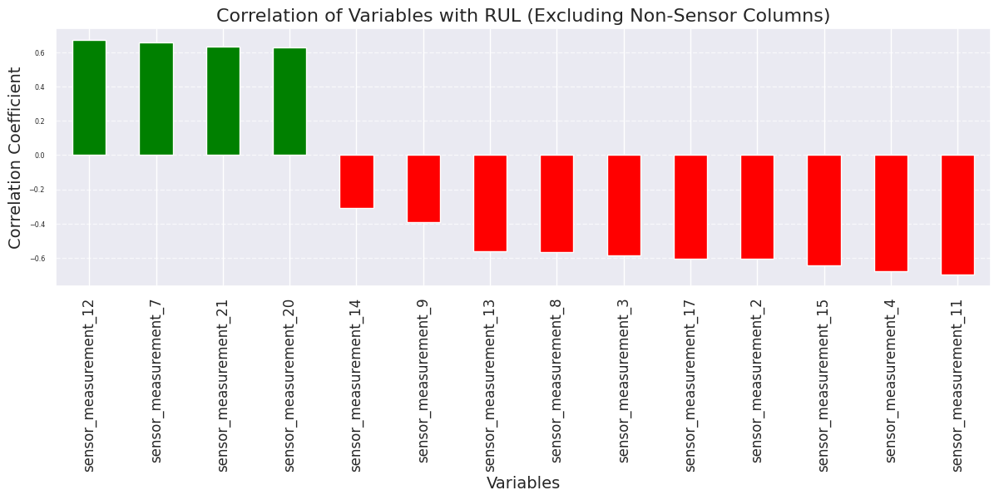

In [14]:
# Define columns to exclude from the correlation analysis
columns_to_exclude = ['unit_number', 'timestamp']

# Extract correlations with RUL, excluding `unit_number` and `timestamp`
columns_for_correlation = [col for col in filtered_train_data.columns if col not in columns_to_exclude]
correlations_with_rul = filtered_train_data[columns_for_correlation].corr()['RUL'].drop('RUL').sort_values(ascending=False)

# Print filtered correlation of each variable with RUL
print("Filtered Correlation of Each Variable with RUL:")
print(correlations_with_rul)

# Display top negatively correlated sensors
print("\nTop Negatively Correlated Variables with RUL:")
print(correlations_with_rul[correlations_with_rul < 0].head(10))

# Visualize the most significant correlations with RUL
plt.figure(figsize=(12, 6))
correlations_with_rul.plot(
    kind='bar',
    color=['green' if x > 0 else 'red' for x in correlations_with_rul]
)
plt.title('Correlation of Variables with RUL (Excluding Non-Sensor Columns)', fontsize=16)
plt.ylabel('Correlation Coefficient', fontsize=14)
plt.xlabel('Variables', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [15]:
print(filtered_train_data.columns)

Index(['unit_number', 'timestamp', 'sensor_measurement_2',
       'sensor_measurement_3', 'sensor_measurement_4', 'sensor_measurement_7',
       'sensor_measurement_8', 'sensor_measurement_9', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21', 'RUL'],
      dtype='object')


In [16]:
print(filtered_train_data.columns)

Index(['unit_number', 'timestamp', 'sensor_measurement_2',
       'sensor_measurement_3', 'sensor_measurement_4', 'sensor_measurement_7',
       'sensor_measurement_8', 'sensor_measurement_9', 'sensor_measurement_11',
       'sensor_measurement_12', 'sensor_measurement_13',
       'sensor_measurement_14', 'sensor_measurement_15',
       'sensor_measurement_17', 'sensor_measurement_20',
       'sensor_measurement_21', 'RUL'],
      dtype='object')


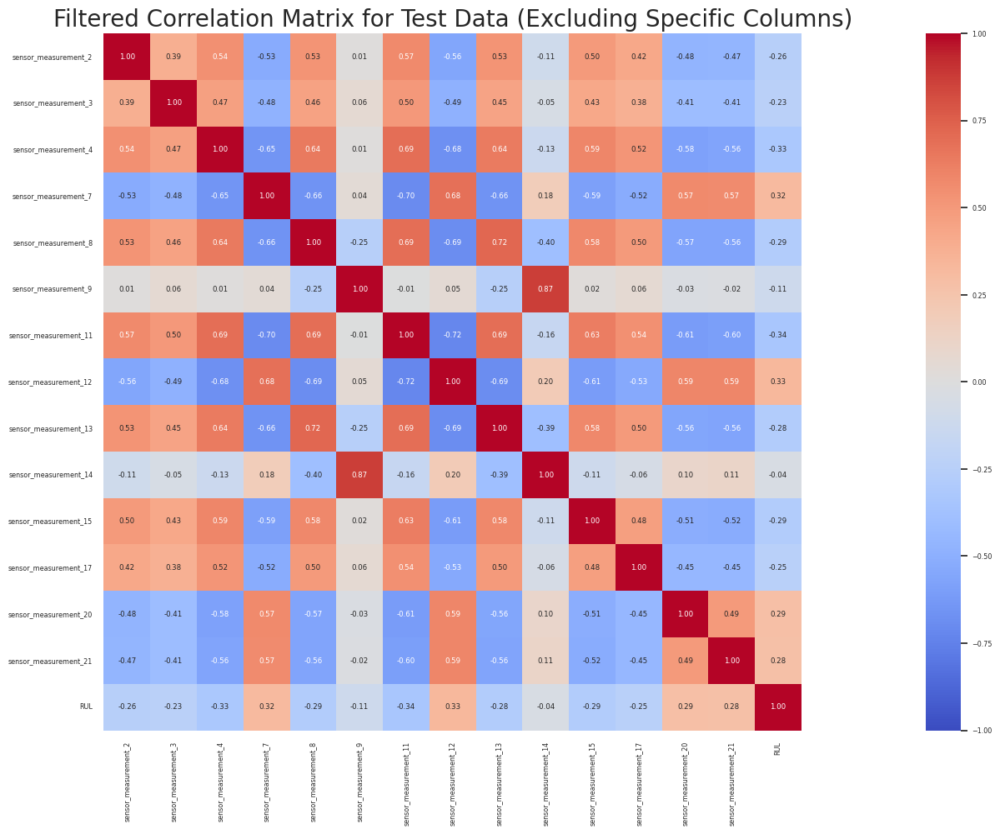

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# Function to remove constant or nearly constant columns
def remove_constant_columns(df, threshold=1e-5):
    """
    Remove columns where the variance is below a threshold (essentially constant or nearly constant values).
    """
    return df.loc[:, df.var() > threshold]

# Remove constant or non-meaningful columns from the test data
filtered_test_data = remove_constant_columns(test_data)

# Define columns to exclude from the correlation calculation
columns_to_exclude = ['unit_number', 'timestamp', 'last_cycle_x', 'RUL_x', 'last_cycle']

# Select columns for correlation computation, excluding the specified columns
columns_for_correlation = [col for col in filtered_test_data.columns if col not in columns_to_exclude]
filtered_test_correlation_matrix = filtered_test_data[columns_for_correlation].corr()

# Plot the filtered correlation heatmap for test data
plt.figure(figsize=(30, 10))  # Adjust the size as needed
sns.set(font_scale=0.52)  # Adjust font scale for better readability
sns.heatmap(
    filtered_test_correlation_matrix,  # Use the actual correlation matrix without absolute values
    vmin=-1, vmax=1,                   # Scale from -1 to 1 to include negative correlations
    cmap="coolwarm",                   # Use the coolwarm colormap to show both negative and positive correlations
    annot=True,                        # Annotate the heatmap with correlation values
    fmt=".2f",                         # Format the annotations with two decimal places
    cbar=True,                         # Show color bar
    square=True                        # Ensure heatmap squares are square-shaped
)

# Add title
plt.title('Filtered Correlation Matrix for Test Data (Excluding Specific Columns)', fontsize=20)
plt.tight_layout()
plt.show()


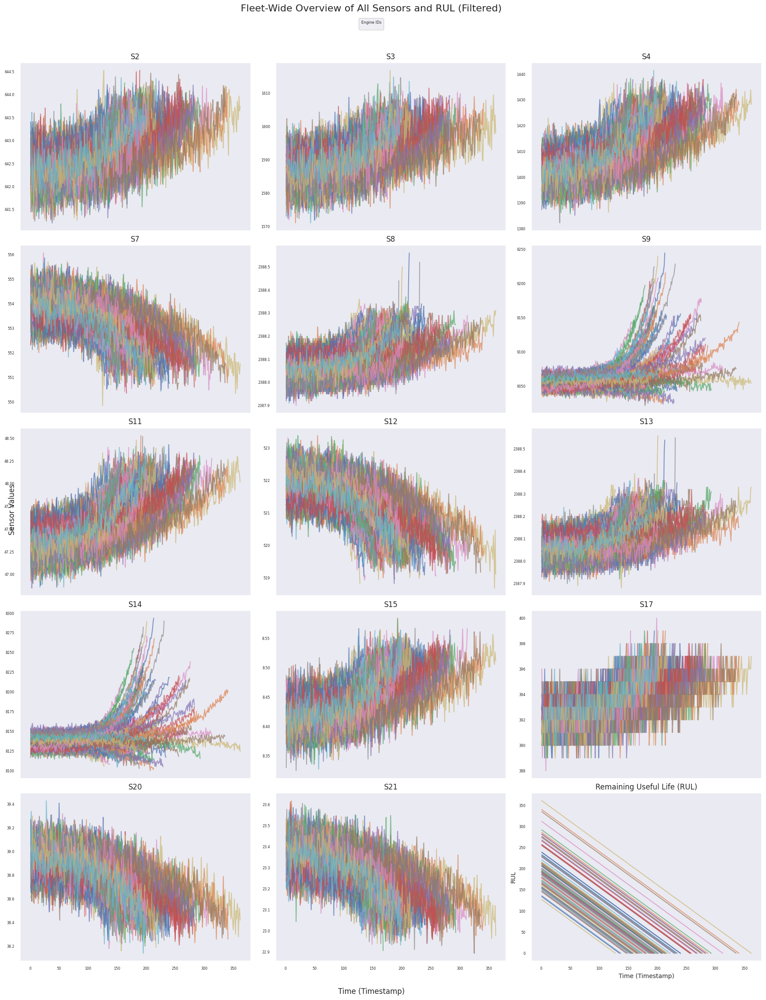

In [18]:
# Select only sensor data columns (remaining sensor columns after filtering)
sensor_columns = [col for col in filtered_train_data.columns if col.startswith('sensor_measurement_')]

# Number of sensors
n_sensors = len(sensor_columns)

# Create a figure with 3 columns of subplots
n_cols = 3
n_rows = (n_sensors + 1 + n_cols - 1) // n_cols  # Add 1 for the RUL plot

fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 24), sharex=True, sharey=False)
axs = axs.flatten()  # Flatten for easier iteration

# Plot each sensor's fleet-wide data in its respective subplot
for i, sensor in enumerate(sensor_columns):
    for engine_id in filtered_train_data['unit_number'].unique():
        # Filter data for the current engine
        engine_data = filtered_train_data[filtered_train_data['unit_number'] == engine_id]

        # Plot the sensor data against timestamp
        axs[i].plot(engine_data['timestamp'], engine_data[sensor], alpha=0.7)

    # Set subplot title and labels
    axs[i].set_title(sensor.replace('sensor_measurement_', 'S'), fontsize=12)
    axs[i].grid()

# Add RUL plot in the last subplot
for engine_id in filtered_train_data['unit_number'].unique():
    # Filter data for the current engine
    engine_data = filtered_train_data[filtered_train_data['unit_number'] == engine_id]

    # Plot the RUL data against timestamp
    axs[n_sensors].plot(engine_data['timestamp'], engine_data['RUL'], alpha=0.7)

# Customize the RUL subplot
axs[n_sensors].set_title('Remaining Useful Life (RUL)', fontsize=12)
axs[n_sensors].set_xlabel('Time (Timestamp)', fontsize=10)
axs[n_sensors].set_ylabel('RUL', fontsize=10)
axs[n_sensors].grid()

# Hide any unused subplots
for j in range(n_sensors + 1, len(axs)):
    axs[j].axis('off')

# Add global labels and title
fig.suptitle('Fleet-Wide Overview of All Sensors and RUL (Filtered)', fontsize=16)
fig.text(0.5, 0.04, 'Time (Timestamp)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Sensor Values', va='center', rotation='vertical', fontsize=12)

# Add legend for the RUL plot
handles, labels = axs[n_sensors].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.97), ncol=8, title='Engine IDs', fontsize=10)

plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()

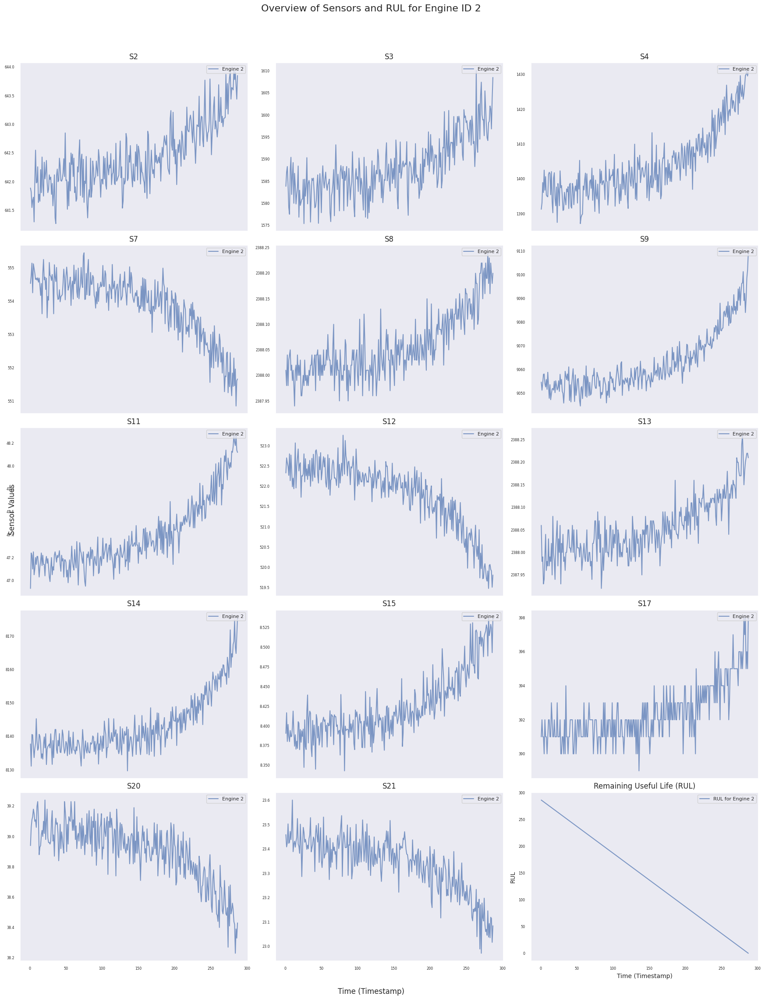

In [19]:
# Specify the engine ID to plot
specific_engine_id = 2  # Replace with the desired engine ID

# Filter data for the specific engine
engine_data = filtered_train_data[filtered_train_data['unit_number'] == specific_engine_id]

# Select only sensor data columns
sensor_columns = [col for col in filtered_train_data.columns if col.startswith('sensor_measurement_')]

# Number of sensors
n_sensors = len(sensor_columns)

# Create a figure with 3 columns of subplots
n_cols = 3
n_rows = (n_sensors + 1 + n_cols - 1) // n_cols  # Add 1 for the RUL plot

fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 24), sharex=True, sharey=False)
axs = axs.flatten()  # Flatten for easier iteration

# Plot each sensor's data in its respective subplot
for i, sensor in enumerate(sensor_columns):
    # Plot the sensor data against timestamp for the specific engine
    axs[i].plot(engine_data['timestamp'], engine_data[sensor], alpha=0.7, label=f'Engine {specific_engine_id}')

    # Set subplot title and labels
    axs[i].set_title(sensor.replace('sensor_measurement_', 'S'), fontsize=12)
    axs[i].legend(loc='upper right', fontsize=8)
    axs[i].grid()

# Add RUL plot in the last subplot
axs[n_sensors].plot(engine_data['timestamp'], engine_data['RUL'], alpha=0.7, label=f'RUL for Engine {specific_engine_id}')
axs[n_sensors].set_title('Remaining Useful Life (RUL)', fontsize=12)
axs[n_sensors].set_xlabel('Time (Timestamp)', fontsize=10)
axs[n_sensors].set_ylabel('RUL', fontsize=10)
axs[n_sensors].legend(loc='upper right', fontsize=8)
axs[n_sensors].grid()

# Hide any unused subplots
for j in range(n_sensors + 1, len(axs)):
    axs[j].axis('off')

# Add global labels and title
fig.suptitle(f'Overview of Sensors and RUL for Engine ID {specific_engine_id}', fontsize=16)
fig.text(0.5, 0.04, 'Time (Timestamp)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Sensor Values', va='center', rotation='vertical', fontsize=12)

plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()


In [20]:
import pandas as pd
import numpy as np

# Define the moving median function
def moving_median(series, window):
    """
    Apply a moving median to the given series with the specified window size.
    """
    return series.rolling(window=window, center=True).median()

# Define the window size for the moving median
window_size = 45  # Adjust this value based on the desired smoothing

# Create storage for trends and residuals
trends = {}
residuals = {}

# Iterate through each engine and sensor
for engine_id in filtered_train_data['unit_number'].unique():
    # Filter data for the current engine
    engine_data = filtered_train_data[filtered_train_data['unit_number'] == engine_id]

    for sensor in [col for col in filtered_train_data.columns if col.startswith('sensor_measurement_')]:
        # Apply moving median to the sensor data
        trend = moving_median(engine_data[sensor], window=window_size)

        # Calculate the residuals (original signal - trend)
        residual = engine_data[sensor] - trend

        # Store the trend and residuals
        if engine_id not in trends:
            trends[engine_id] = {}
            residuals[engine_id] = {}

        trends[engine_id][sensor] = trend
        residuals[engine_id][sensor] = residual

# Convert the stored trends and residuals to a DataFrame for each engine
trends_df = {engine_id: pd.DataFrame(data).reset_index() for engine_id, data in trends.items()}
residuals_df = {engine_id: pd.DataFrame(data).reset_index() for engine_id, data in residuals.items()}

print("Smoothing complete! Trends and residuals stored.")


Smoothing complete! Trends and residuals stored.


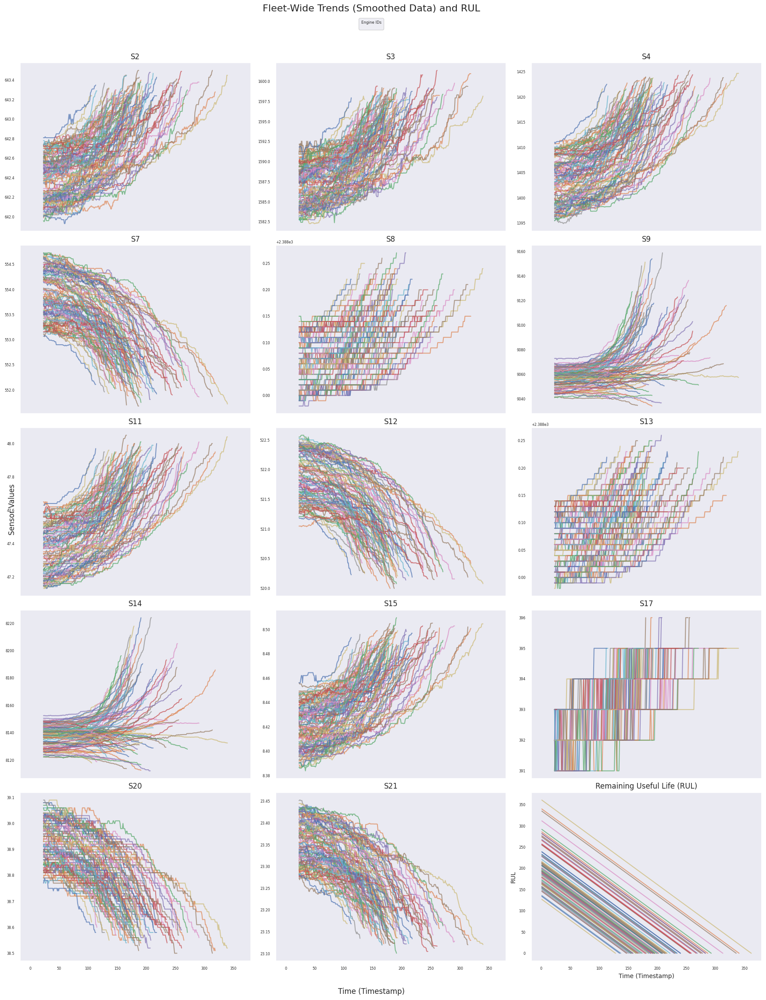

In [21]:
import matplotlib.pyplot as plt

# Number of sensors
n_sensors = len(sensor_columns)

# Create a figure with 3 columns of subplots
n_cols = 3
n_rows = (n_sensors + 1 + n_cols - 1) // n_cols  # Add 1 for the RUL plot

fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 24), sharex=True, sharey=False)
axs = axs.flatten()  # Flatten for easier iteration

# Plot each sensor's fleet-wide trend data in its respective subplot
for i, sensor in enumerate(sensor_columns):
    for engine_id in trends.keys():  # Iterate over all engines in the trends dictionary
        # Get trend data for the current sensor and engine
        trend_data = trends[engine_id][sensor]
        timestamp_data = filtered_train_data[filtered_train_data['unit_number'] == engine_id]['timestamp']

        # Plot the trend data against timestamp
        axs[i].plot(timestamp_data, trend_data, alpha=0.7, label=f'Engine {engine_id}' if i == 0 else None)

    # Set subplot title and labels
    axs[i].set_title(sensor.replace('sensor_measurement_', 'S'), fontsize=12)
    axs[i].grid()

# Add RUL plot in the last subplot
for engine_id in trends.keys():
    # Filter data for the current engine
    engine_data = filtered_train_data[filtered_train_data['unit_number'] == engine_id]

    # Plot the RUL data against timestamp
    axs[n_sensors].plot(engine_data['timestamp'], engine_data['RUL'], alpha=0.7)

# Customize the RUL subplot
axs[n_sensors].set_title('Remaining Useful Life (RUL)', fontsize=12)
axs[n_sensors].set_xlabel('Time (Timestamp)', fontsize=10)
axs[n_sensors].set_ylabel('RUL', fontsize=10)
axs[n_sensors].grid()

# Hide any unused subplots
for j in range(n_sensors + 1, len(axs)):
    axs[j].axis('off')

# Add global labels and title
fig.suptitle('Fleet-Wide Trends (Smoothed Data) and RUL', fontsize=16)
fig.text(0.5, 0.04, 'Time (Timestamp)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Sensor Values', va='center', rotation='vertical', fontsize=12)

# Add legend for the RUL plot
handles, labels = axs[n_sensors].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.97), ncol=8, title='Engine IDs', fontsize=10)

plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()


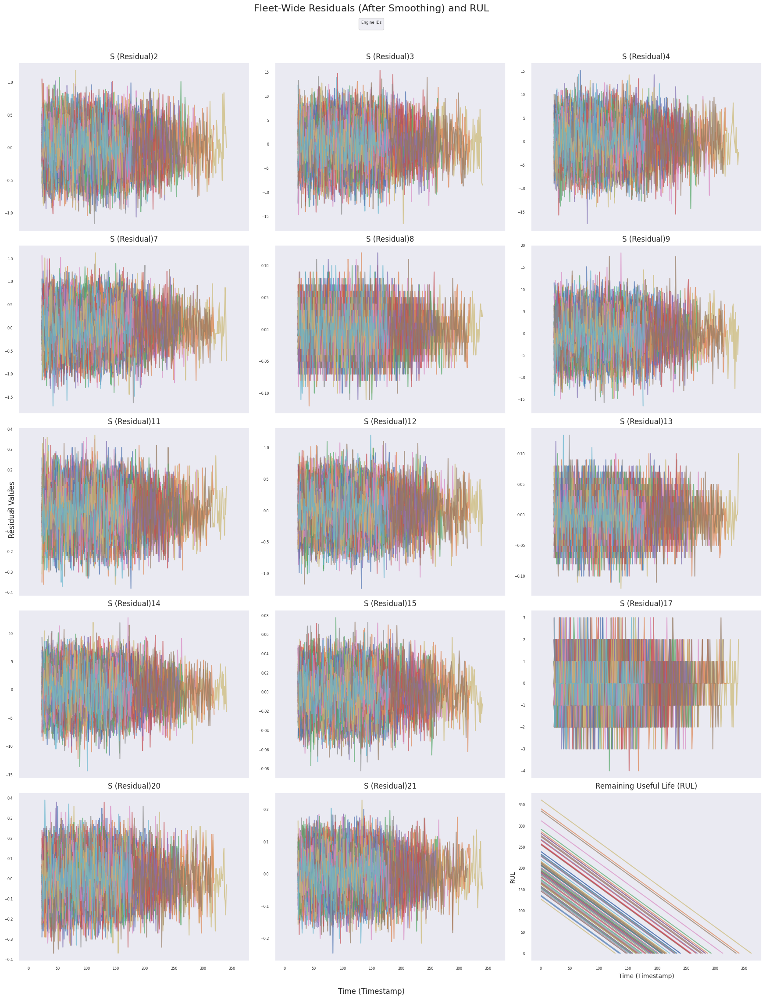

In [22]:
import matplotlib.pyplot as plt

# Number of sensors
n_sensors = len(sensor_columns)

# Create a figure with 3 columns of subplots
n_cols = 3
n_rows = (n_sensors + 1 + n_cols - 1) // n_cols  # Add 1 for the RUL plot

fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 24), sharex=True, sharey=False)
axs = axs.flatten()  # Flatten for easier iteration

# Plot each sensor's fleet-wide residual data in its respective subplot
for i, sensor in enumerate(sensor_columns):
    for engine_id in residuals.keys():  # Iterate over all engines in the residuals dictionary
        # Get residual data for the current sensor and engine
        residual_data = residuals[engine_id][sensor]
        timestamp_data = filtered_train_data[filtered_train_data['unit_number'] == engine_id]['timestamp']

        # Plot the residual data against timestamp
        axs[i].plot(timestamp_data, residual_data, alpha=0.7, label=f'Engine {engine_id}' if i == 0 else None)

    # Set subplot title and labels
    axs[i].set_title(sensor.replace('sensor_measurement_', 'S (Residual)'), fontsize=12)
    axs[i].grid()

# Add RUL plot in the last subplot
for engine_id in residuals.keys():
    # Filter data for the current engine
    engine_data = filtered_train_data[filtered_train_data['unit_number'] == engine_id]

    # Plot the RUL data against timestamp
    axs[n_sensors].plot(engine_data['timestamp'], engine_data['RUL'], alpha=0.7)

# Customize the RUL subplot
axs[n_sensors].set_title('Remaining Useful Life (RUL)', fontsize=12)
axs[n_sensors].set_xlabel('Time (Timestamp)', fontsize=10)
axs[n_sensors].set_ylabel('RUL', fontsize=10)
axs[n_sensors].grid()

# Hide any unused subplots
for j in range(n_sensors + 1, len(axs)):
    axs[j].axis('off')

# Add global labels and title
fig.suptitle('Fleet-Wide Residuals (After Smoothing) and RUL', fontsize=16)
fig.text(0.5, 0.04, 'Time (Timestamp)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Residual Values', va='center', rotation='vertical', fontsize=12)

# Add legend for the RUL plot
handles, labels = axs[n_sensors].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.97), ncol=8, title='Engine IDs', fontsize=10)

plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()


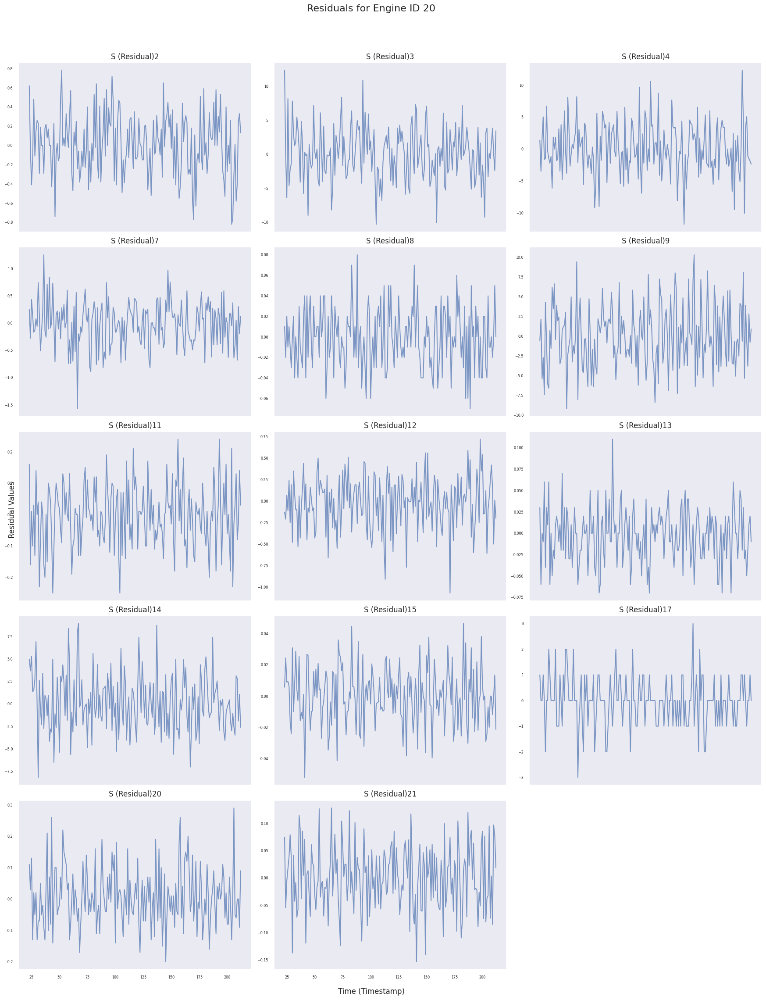

In [23]:
import matplotlib.pyplot as plt

# Specify the engine ID to plot residuals for
engine_id = 20  # Replace with the desired engine ID

# Filter the residual data and timestamps for the selected engine
engine_residuals = residuals[engine_id]
engine_timestamps = filtered_train_data[filtered_train_data['unit_number'] == engine_id]['timestamp']

# Number of sensors
n_sensors = len(sensor_columns)

# Create a figure with 3 columns of subplots
n_cols = 3
n_rows = (n_sensors + n_cols - 1) // n_cols  # Calculate required rows for 3 columns

fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 24), sharex=True, sharey=False)
axs = axs.flatten()  # Flatten for easier iteration

# Plot each sensor's residuals in its respective subplot
for i, sensor in enumerate(sensor_columns):
    # Get the residual data for the current sensor
    residual_data = engine_residuals[sensor]

    # Plot the residual data against timestamp
    axs[i].plot(engine_timestamps, residual_data, alpha=0.7, label=f'Residual ({sensor})')

    # Set subplot title and labels
    axs[i].set_title(sensor.replace('sensor_measurement_', 'S (Residual)'), fontsize=12)
    axs[i].grid()

# Hide any unused subplots
for j in range(n_sensors, len(axs)):
    axs[j].axis('off')

# Add global labels and title
fig.suptitle(f'Residuals for Engine ID {engine_id}', fontsize=16)
fig.text(0.5, 0.04, 'Time (Timestamp)', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Residual Values', va='center', rotation='vertical', fontsize=12)

plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()


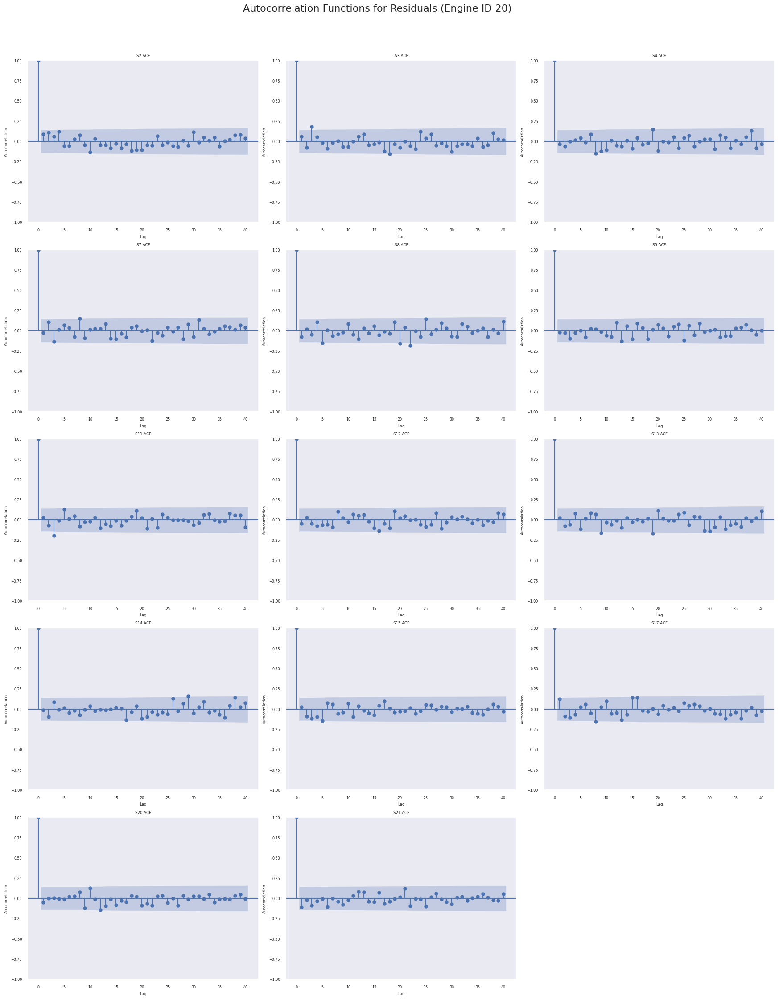

In [24]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
import numpy as np

# Specify the engine ID to analyze
engine_id = 20  # Replace with the desired engine ID

# Filter the residual data for the selected engine
engine_residuals = residuals[engine_id]

# Number of sensors
n_sensors = len(sensor_columns)

# Create a figure with 3 columns of subplots
n_cols = 3
n_rows = (n_sensors + n_cols - 1) // n_cols  # Calculate required rows for 3 columns

fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 24), sharex=False, sharey=False)
axs = axs.flatten()  # Flatten for easier iteration

# Plot ACF for each sensor's residuals
for i, sensor in enumerate(sensor_columns):
    # Get the residual data for the current sensor
    residual_data = engine_residuals[sensor].dropna()  # Drop NaN values if present

    # Plot the autocorrelation function
    plot_acf(residual_data, ax=axs[i], lags=40, title=f"{sensor.replace('sensor_measurement_', 'S')} ACF")
    axs[i].set_xlabel('Lag')
    axs[i].set_ylabel('Autocorrelation')
    axs[i].grid()

# Hide any unused subplots
for j in range(n_sensors, len(axs)):
    axs[j].axis('off')

# Add global title
fig.suptitle(f'Autocorrelation Functions for Residuals (Engine ID {engine_id})', fontsize=16)
plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()


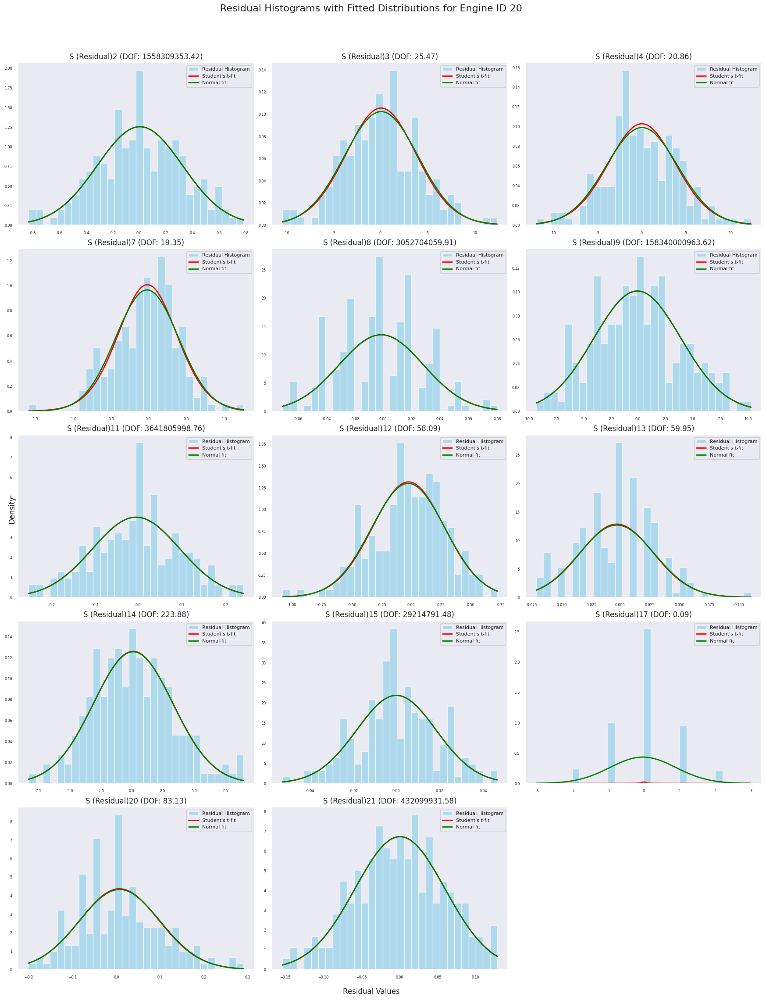

In [25]:
import matplotlib.pyplot as plt
from scipy.stats import t, norm
import numpy as np

# Specify the engine ID to analyze
engine_id = 20  # Replace with the desired engine ID

# Filter the residual data for the selected engine
engine_residuals = residuals[engine_id]

# Number of sensors
n_sensors = len(sensor_columns)

# Create a figure with 3 columns of subplots
n_cols = 3
n_rows = (n_sensors + n_cols - 1) // n_cols  # Calculate required rows for 3 columns

fig, axs = plt.subplots(n_rows, n_cols, figsize=(18, 24), sharex=False, sharey=False)
axs = axs.flatten()  # Flatten for easier iteration

# Plot histogram and fitted distributions for each sensor's residuals
for i, sensor in enumerate(sensor_columns):
    # Get the residual data for the current sensor
    residual_data = engine_residuals[sensor].dropna()  # Drop NaN values if present

    # Plot histogram of residuals
    axs[i].hist(residual_data, bins=30, density=True, alpha=0.6, color='skyblue', label='Residual Histogram')

    # Fit a Student's t-distribution to the residual data
    t_params = t.fit(residual_data)
    t_pdf = t.pdf(np.linspace(residual_data.min(), residual_data.max(), 100), *t_params)
    axs[i].plot(np.linspace(residual_data.min(), residual_data.max(), 100), t_pdf, label="Student's t-fit", color='red', lw=2)

    # Fit a Normal distribution to the residual data
    mean, std = norm.fit(residual_data)
    normal_pdf = norm.pdf(np.linspace(residual_data.min(), residual_data.max(), 100), mean, std)
    axs[i].plot(np.linspace(residual_data.min(), residual_data.max(), 100), normal_pdf, label='Normal fit', color='green', lw=2)

    # Extract the degree of freedom (DOF) for Student's t-distribution
    dof = round(t_params[0], 2)  # Degrees of freedom

    # Set subplot title and labels
    axs[i].set_title(f"{sensor.replace('sensor_measurement_', 'S (Residual)')} (DOF: {dof})", fontsize=12)
    axs[i].grid()
    axs[i].legend(loc='upper right', fontsize=8)

# Hide any unused subplots
for j in range(n_sensors, len(axs)):
    axs[j].axis('off')

# Add global labels and title
fig.suptitle(f'Residual Histograms with Fitted Distributions for Engine ID {engine_id}', fontsize=16)
fig.text(0.5, 0.04, 'Residual Values', ha='center', fontsize=12)
fig.text(0.04, 0.5, 'Density', va='center', rotation='vertical', fontsize=12)

plt.tight_layout(rect=[0.03, 0.05, 1, 0.95])
plt.show()



# **PCA**
Principal Component Analysis (PCA) is a statistical technique used for dimension reduction by transforming high-dimensional data into a smaller set of uncorrelated variables called principal components. These components are linear combinations of the original features, ordered by the amount of variance they explain, with the first few capturing most of the data's variability. PCA simplifies data analysis, reduces noise, and improves computational efficiency while preserving the most critical information.

1.   Visualizing high-dimensional data is challenging. PCA allows data to be projected into 2D or 3D for better visualization, enabling researchers to understand patterns, clusters, or trends.
2.   PCA generates new features (principal components) that may combine original features in meaningful ways. These new features can be more informative for predictive modeling.



*Here are some well-known dimension reduction (DR) techniques besides PCA:*

Linear Techniques:

    Linear Discriminant Analysis (LDA): Focuses on maximizing the separability between classes in labeled data.
    Factor Analysis (FA): Explains observed data using a smaller set of latent variables (factors) based on correlations.
    Independent Component Analysis (ICA): Separates mixed signals into statistically independent components.

Non-Linear Techniques:

    t-Distributed Stochastic Neighbor Embedding (t-SNE): Maps high-dimensional data to a lower-dimensional space (often 2D or 3D) while preserving local structures for visualization.
    Uniform Manifold Approximation and Projection (UMAP): Similar to t-SNE but faster and better for preserving both local and global structures.
    Kernel PCA: Extends PCA by using kernel functions to capture non-linear relationships.

Matrix Factorization-Based Techniques:

    Non-Negative Matrix Factorization (NMF): Decomposes data into non-negative components, often used in image and text data.
    Singular Value Decomposition (SVD): Factorizes a matrix into singular vectors and singular values, commonly used in latent semantic analysis (LSA).

Sparse Representation Techniques:

    Sparse PCA: A variation of PCA that enforces sparsity to ensure fewer features contribute to each principal component.

Manifold Learning Techniques:

    Isomap: Preserves global geometric structure in lower-dimensional embedding by capturing geodesic distances.
    Locally Linear Embedding (LLE): Focuses on preserving local neighborhood relationships in the data.

Autoencoder-Based Techniques (Deep Learning):

    Autoencoders: Neural networks trained to compress input data into a latent space and reconstruct it, enabling non-linear dimension reduction.
    Variational Autoencoders (VAEs): A probabilistic extension of autoencoders for reducing dimensions with added structure in the latent space.

In [26]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Select only sensor data columns (remaining sensor columns after filtering)
sensor_columns = [col for col in filtered_train_data.columns if col.startswith('sensor_measurement_')]

# Extract the sensor data for PCA
sensor_data = filtered_train_data[sensor_columns]

# Standardize the data before applying PCA
scaler = StandardScaler()
sensor_data_scaled = scaler.fit_transform(sensor_data)

# Apply PCA
n_components = 3  # Number of principal components to retain
pca = PCA(n_components=n_components)
sensor_data_pca = pca.fit_transform(sensor_data_scaled)

# Create a DataFrame for the PCA-transformed data
pca_columns = [f"PC{i+1}" for i in range(n_components)]
sensor_data_pca_df = pd.DataFrame(sensor_data_pca, columns=pca_columns)

# Add engine ID and timestamp back to the PCA-transformed data
sensor_data_pca_df['unit_number'] = filtered_train_data['unit_number'].values
sensor_data_pca_df['timestamp'] = filtered_train_data['timestamp'].values

# Explained variance ratio
explained_variance = pca.explained_variance_ratio_

# Output the explained variance
print(f"Explained variance ratio for the first {n_components} principal components: {explained_variance}")
print(f"Total explained variance: {explained_variance.sum()}")

# Show the first few rows of the PCA-transformed data
print(sensor_data_pca_df.head())


Explained variance ratio for the first 3 principal components: [0.64250561 0.14970975 0.02957833]
Total explained variance: 0.8217936815320629
        PC1       PC2       PC3  unit_number  timestamp
0 -2.959698 -0.436217  0.817832            1          1
1 -2.374246 -0.781728  0.956063            1          2
2 -2.994228 -0.533209  0.598888            1          3
3 -3.400753 -0.824265 -0.408637            1          4
4 -2.436515 -0.362540 -0.721222            1          5


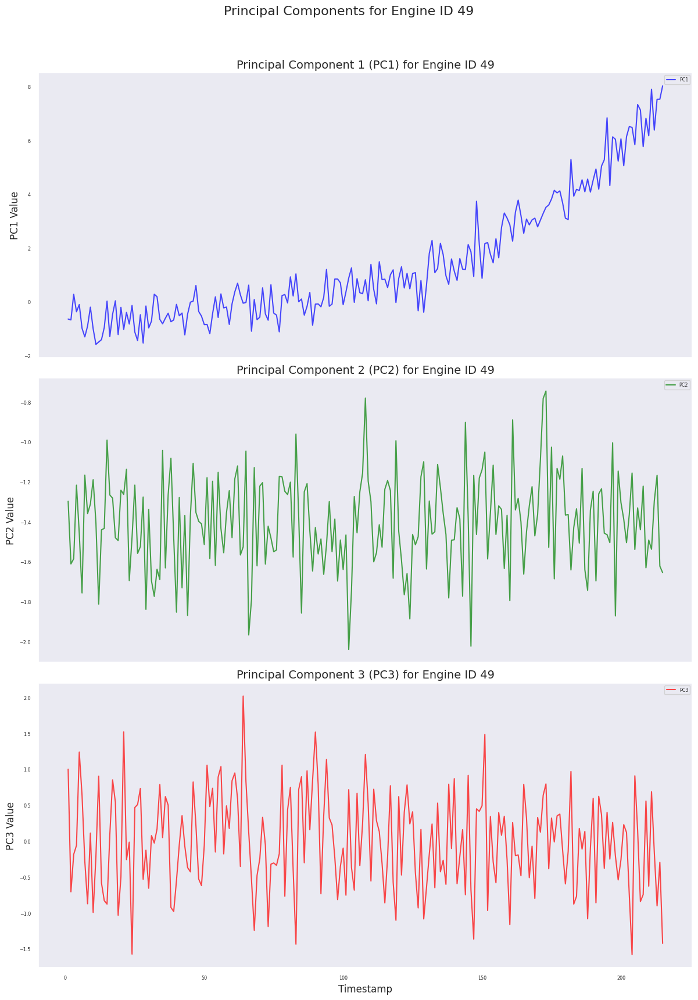

In [27]:
import matplotlib.pyplot as plt

# Specify the engine ID to visualize
engine_id = 49  # Replace with the desired engine ID

# Filter the PCA-transformed data for the selected engine
single_engine_pca = sensor_data_pca_df[sensor_data_pca_df['unit_number'] == engine_id]

# Create a figure with 3 subplots for PC1, PC2, and PC3
fig, axs = plt.subplots(3, 1, figsize=(12, 18), sharex=True)

# Plot PC1
axs[0].plot(single_engine_pca['timestamp'], single_engine_pca['PC1'], label='PC1', color='blue', alpha=0.7)
axs[0].set_title(f'Principal Component 1 (PC1) for Engine ID {engine_id}', fontsize=14)
axs[0].set_ylabel('PC1 Value', fontsize=12)
axs[0].grid()
axs[0].legend()

# Plot PC2
axs[1].plot(single_engine_pca['timestamp'], single_engine_pca['PC2'], label='PC2', color='green', alpha=0.7)
axs[1].set_title(f'Principal Component 2 (PC2) for Engine ID {engine_id}', fontsize=14)
axs[1].set_ylabel('PC2 Value', fontsize=12)
axs[1].grid()
axs[1].legend()

# Plot PC3
axs[2].plot(single_engine_pca['timestamp'], single_engine_pca['PC3'], label='PC3', color='red', alpha=0.7)
axs[2].set_title(f'Principal Component 3 (PC3) for Engine ID {engine_id}', fontsize=14)
axs[2].set_xlabel('Timestamp', fontsize=12)
axs[2].set_ylabel('PC3 Value', fontsize=12)
axs[2].grid()
axs[2].legend()

# Add a global title
fig.suptitle(f'Principal Components for Engine ID {engine_id}', fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


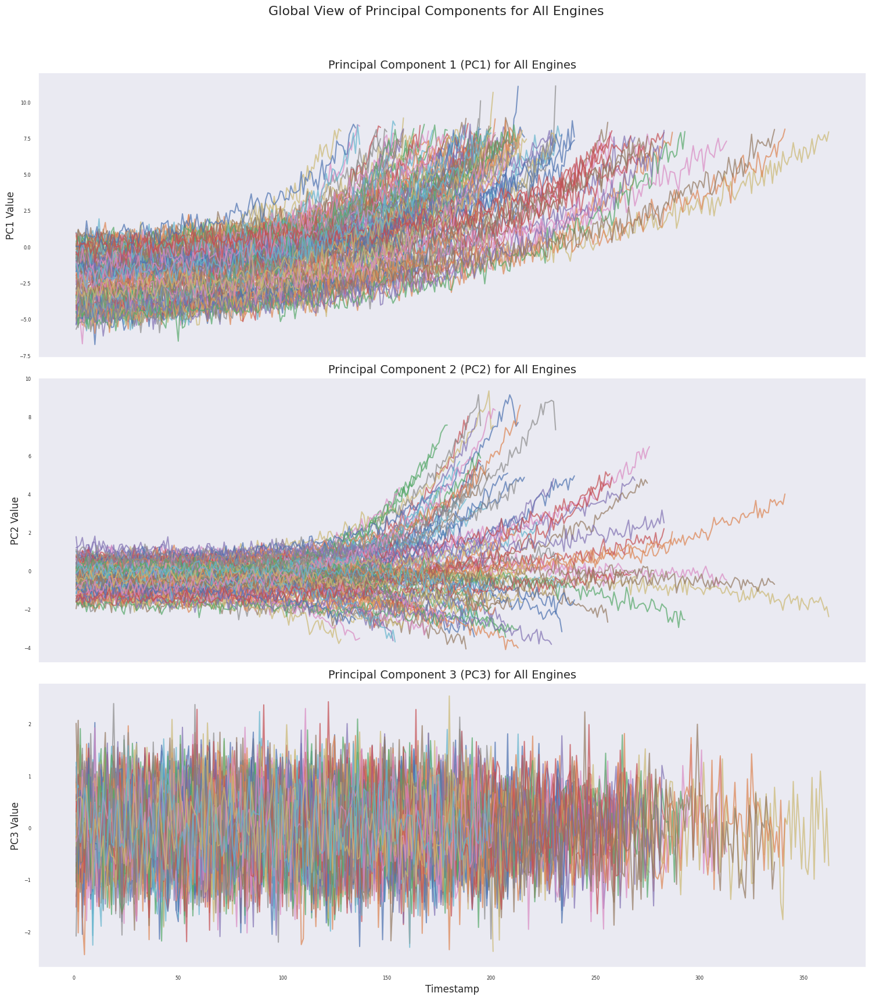

In [28]:
import matplotlib.pyplot as plt

# Create a figure with 3 subplots for PC1, PC2, and PC3
fig, axs = plt.subplots(3, 1, figsize=(15, 18), sharex=True)

# Plot PC1 for all engines
for engine_id in sensor_data_pca_df['unit_number'].unique():
    engine_data = sensor_data_pca_df[sensor_data_pca_df['unit_number'] == engine_id]
    axs[0].plot(engine_data['timestamp'], engine_data['PC1'], label=f'Engine {engine_id}', alpha=0.7)

axs[0].set_title('Principal Component 1 (PC1) for All Engines', fontsize=14)
axs[0].set_ylabel('PC1 Value', fontsize=12)
axs[0].grid()

# Plot PC2 for all engines
for engine_id in sensor_data_pca_df['unit_number'].unique():
    engine_data = sensor_data_pca_df[sensor_data_pca_df['unit_number'] == engine_id]
    axs[1].plot(engine_data['timestamp'], engine_data['PC2'], alpha=0.7)

axs[1].set_title('Principal Component 2 (PC2) for All Engines', fontsize=14)
axs[1].set_ylabel('PC2 Value', fontsize=12)
axs[1].grid()

# Plot PC3 for all engines
for engine_id in sensor_data_pca_df['unit_number'].unique():
    engine_data = sensor_data_pca_df[sensor_data_pca_df['unit_number'] == engine_id]
    axs[2].plot(engine_data['timestamp'], engine_data['PC3'], alpha=0.7)

axs[2].set_title('Principal Component 3 (PC3) for All Engines', fontsize=14)
axs[2].set_xlabel('Timestamp', fontsize=12)
axs[2].set_ylabel('PC3 Value', fontsize=12)
axs[2].grid()

# Add a global title
fig.suptitle('Global View of Principal Components for All Engines', fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# **OCC_SVM**

    One-Class SVM is a variation of the Support Vector Machine (SVM) designed for unsupervised learning or situations where you only have data from one class (the "normal" class).
    It aims to learn a decision boundary that encompasses the majority of the data points in the feature space, treating data outside this boundary as anomalies or outliers.

Key Characteristics

    Objective:
        The algorithm creates a boundary (or hypersphere) around the "normal" data points while maximizing the margin from the origin or other regions considered "abnormal."

    Applications:
        Anomaly detection: Identifying fraud, system failures, or unusual patterns.
        Novelty detection: Finding new patterns in data streams.
        Outlier detection: Flagging rare or unusual events.

    Kernel Function:
        OCC-SVM can use kernel functions (e.g., linear, radial basis function (RBF), or polynomial) to capture non-linear relationships in the data.

    Hyperparameters:
        ν (nu): Controls the trade-off between the fraction of outliers and the size of the support vector boundary.
        Kernel parameters: For example, the gamma parameter in the RBF kernel controls the smoothness of the decision boundary.

Advantages

    Effective in high-dimensional spaces and works well with non-linear data.
    Requires no labeled data for the "anomalous" class.

Limitations

    Sensitive to the choice of hyperparameters (like ν and kernel parameters).
    Assumes that the data is relatively "dense" for the normal class, which may not always be true.
    Performance can degrade if the data is imbalanced or noisy.

Common Use Cases

    Aerospace: Detecting faults in engines or systems.
    Industrial Systems: Detecting machine failures or unusual operating conditions.

In [29]:
from sklearn.svm import OneClassSVM
import numpy as np
import matplotlib.pyplot as plt

# Extract PC1 and timestamps
pc1_data = sensor_data_pca_df[['timestamp', 'PC1', 'unit_number']]

# Filter data for the training period (first 50 time steps across all engines)
train_data = pc1_data[pc1_data['timestamp'] <= 50]

# Extract the PC1 values for training
X_train = train_data['PC1'].values.reshape(-1, 1)

# Train the One-Class SVM on the first 50 time steps
ocsvm = OneClassSVM(kernel="rbf", gamma=0.1, nu=0.05)  # gamma and nu can be tuned
ocsvm.fit(X_train)

# Apply the trained model to all data (predict novelty for all time steps)
X_test = pc1_data['PC1'].values.reshape(-1, 1)
y_pred = ocsvm.predict(X_test)

# Add the novelty predictions to the dataset
pc1_data['novelty'] = y_pred





<ipython-input-29-c01afe7b133b>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pc1_data['novelty'] = y_pred


<ipython-input-30-0faebb563e6b>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  engine_data['novelty'] = y_pred


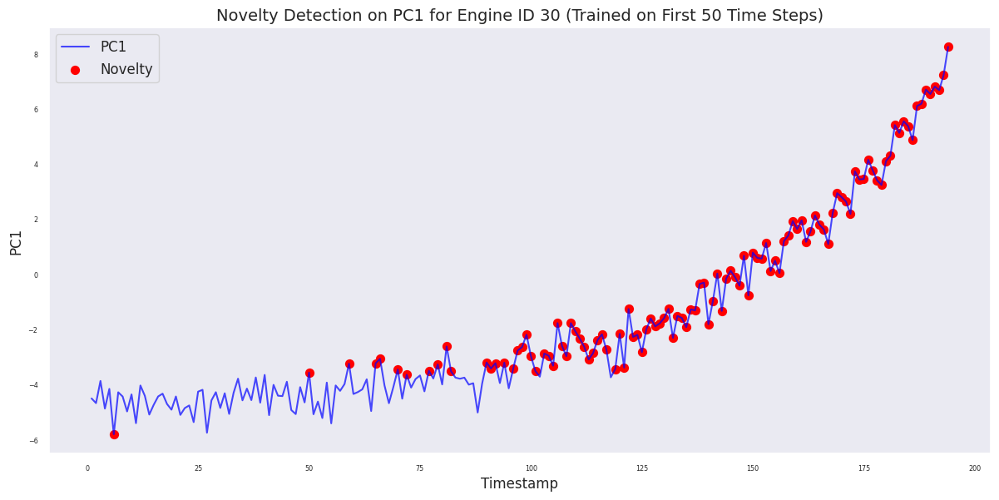

In [30]:
# Specify the engine ID to analyze
engine_id = 30  # Replace with the desired engine ID

# Extract PC1 and timestamps
pc1_data = sensor_data_pca_df[['timestamp', 'PC1', 'unit_number']]

# Filter data for the training period (first 50 time steps across all engines)
train_data = pc1_data[(pc1_data['timestamp'] <= 50) & (pc1_data['unit_number'] == engine_id)]

# Extract the PC1 values for training
X_train = train_data['PC1'].values.reshape(-1, 1)

# Train the One-Class SVM on the first 50 time steps of the specific engine
ocsvm = OneClassSVM(kernel="rbf", gamma=0.1, nu=0.05)  # gamma and nu can be tuned
ocsvm.fit(X_train)

# Filter data for the specific engine
engine_data = pc1_data[pc1_data['unit_number'] == engine_id]

# Apply the trained model to all time steps for the specific engine
X_test = engine_data['PC1'].values.reshape(-1, 1)
y_pred = ocsvm.predict(X_test)

# Add the novelty predictions to the engine's dataset
engine_data['novelty'] = y_pred

# Plot PC1 with novelty detection results for the specific engine
plt.figure(figsize=(12, 6))
plt.plot(engine_data['timestamp'], engine_data['PC1'], label='PC1', color='blue', alpha=0.7)
plt.scatter(engine_data['timestamp'][engine_data['novelty'] == -1],
            engine_data['PC1'][engine_data['novelty'] == -1],
            color='red', label='Novelty', s=50)
plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('PC1', fontsize=12)
plt.title(f'Novelty Detection on PC1 for Engine ID {engine_id} (Trained on First 50 Time Steps)', fontsize=14)
plt.legend(fontsize=12)
plt.grid()
plt.tight_layout()
plt.show()


# **OCC-AE**

One-Class Autoencoder (OCC-AE) is a deep learning-based anomaly detection technique that uses an autoencoder to model the "normal" behavior of the data. It detects anomalies by evaluating how well the trained autoencoder reconstructs input data: anomalies typically result in higher reconstruction errors because they deviate from the normal patterns learned during training.
How OCC-AE Works

    Training Phase:
        Train an autoencoder (a neural network) using only normal data.
        The autoencoder learns to compress the normal data into a latent representation and then reconstruct it back into its original form.
        The goal is to minimize the reconstruction error for the normal class.

    Testing Phase:
        During inference, data points (both normal and potentially anomalous) are passed through the autoencoder.
        Reconstruction Error is calculated as the difference between the input and reconstructed data.
        If the reconstruction error exceeds a predefined threshold, the data point is flagged as an anomaly.

Key Characteristics of OCC-AE

    Objective:
        Capture the underlying patterns and structure of normal data to distinguish normal instances from anomalies.

    Architecture:
        Autoencoders consist of:
            Encoder: Maps input data to a lower-dimensional latent space.
            Decoder: Reconstructs the input data from the latent space.
        Can use simple feedforward networks or more complex architectures (e.g., convolutional autoencoders for image data).

    Anomaly Detection Threshold:
        The threshold for reconstruction error can be set using a validation set of normal data or via statistical methods (e.g., mean + k standard deviations).

Advantages

    Non-linear modeling:
        Unlike One-Class SVM, which may struggle with complex non-linear data, autoencoders can model highly non-linear relationships.

    Scalability:
        Can handle large, high-dimensional datasets, such as time series, images, or other structured data.

    Flexible architecture:
        Autoencoders can be adapted to specific tasks (e.g., convolutional layers for images, recurrent layers for time series).

Limitations

    Need for Proper Training Data:
        OCC-AE requires a representative dataset of normal behavior for training. Poor or incomplete training data will degrade performance.

    Sensitivity to Noise:
        If training data contains noise or mislabeled anomalies, the model may learn a suboptimal representation.

    Threshold Selection:
        Choosing the reconstruction error threshold can be challenging and often requires domain knowledge or additional validation data.

Applications

    Aerospace: Detecting anomalies in sensor data from aircraft engines.
    Industrial Systems: Monitoring equipment for predictive maintenance by identifying deviations from normal behavior.

In [31]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt

# Extract PC1 and timestamps for all engines
pc1_data_all = sensor_data_pca_df[['timestamp', 'PC1', 'unit_number']]

# Filter data for the training period (first 50 time steps across all engines)
train_data_all = pc1_data_all[pc1_data_all['timestamp'] <= 50]

# Scale the PC1 data for training
scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_data_all['PC1'].values.reshape(-1, 1))

# Define the Autoencoder model
autoencoder = Sequential([
    Dense(8, activation='relu', input_dim=1),  # Encoder
    Dense(1, activation='linear')              # Decoder
])

# Compile the Autoencoder
autoencoder.compile(optimizer='adam', loss='mse')

# Train the Autoencoder using all engines' first 50 time steps
history = autoencoder.fit(
    train_scaled,
    train_scaled,
    epochs=50,
    batch_size=8,
    verbose=0
)




/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [36]:
# Specify the engine ID for testing
engine_id = 29  # Replace with the desired engine ID

# Extract PC1 and timestamps for the specific engine
engine_data = pc1_data_all[pc1_data_all['unit_number'] == engine_id]

# Scale the specific engine's PC1 data
engine_scaled = scaler.transform(engine_data['PC1'].values.reshape(-1, 1))

# Apply the Autoencoder to the specific engine's data
reconstructed = autoencoder.predict(engine_scaled)

# Compute the reconstruction error
reconstruction_error = np.mean((engine_scaled - reconstructed) ** 2, axis=1)

# Define a threshold for novelty detection (e.g., 95th percentile of training error)
threshold = np.percentile(np.mean((train_scaled - autoencoder.predict(train_scaled)) ** 2, axis=1), 95)

# Flag novelty based on reconstruction error
engine_data['novelty'] = reconstruction_error > threshold

# Plot PC1 with novelty detection results for the specific engine
plt.figure(figsize=(12, 6))
plt.plot(engine_data['timestamp'], engine_data['PC1'], label='PC1', color='blue', alpha=0.7)
plt.scatter(engine_data['timestamp'][engine_data['novelty']],
            engine_data['PC1'][engine_data['novelty']],
            color='red', label='Novelty', s=50)
plt.axhline(y=threshold, color='green', linestyle='--', label='Threshold')
plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('PC1', fontsize=12)
plt.title(f'Novelty Detection on PC1 for Engine ID {engine_id} (AE-Based, Trained on All Engines)', fontsize=14)
plt.legend(fontsize=12)
plt.grid()
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


ValueError: X has 1 features, but MinMaxScaler is expecting 14 features as input.

In [33]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt

# Select only the sensor measurement columns from the filtered training data
sensor_columns = [col for col in filtered_train_data.columns if col.startswith('sensor_measurement_')]
sensor_data = filtered_train_data[sensor_columns]
timestamps = filtered_train_data['timestamp']
unit_numbers = filtered_train_data['unit_number']

# Normalize the sensor data to [0, 1]
scaler = MinMaxScaler()
sensor_data_scaled = scaler.fit_transform(sensor_data)

# Split into training (first 50 time steps for all engines) and testing
train_data = filtered_train_data[filtered_train_data['timestamp'] <= 50]
train_scaled = scaler.transform(train_data[sensor_columns])

# Define the Autoencoder
autoencoder = Sequential([
    Dense(64, activation='relu', input_dim=len(sensor_columns)),  # Encoder
    Dense(32, activation='relu'),                                # Bottleneck
    Dense(64, activation='relu'),                                # Decoder
    Dense(len(sensor_columns), activation='linear')              # Output layer
])

# Compile the Autoencoder
autoencoder.compile(optimizer='adam', loss='mse')

# Train the Autoencoder on the first 50 time steps (all engines)
history = autoencoder.fit(
    train_scaled,
    train_scaled,
    epochs=50,
    batch_size=8,
    verbose=0
)

# Reconstruct all data using the trained Autoencoder
reconstructed = autoencoder.predict(sensor_data_scaled)

# Compute reconstruction errors
reconstruction_error = np.mean((sensor_data_scaled - reconstructed) ** 2, axis=1)

# Define a threshold for novelty detection (e.g., 95th percentile of training error)
threshold = np.percentile(np.mean((train_scaled - autoencoder.predict(train_scaled)) ** 2, axis=1), 95)

# Flag novelty based on reconstruction error
filtered_train_data['novelty'] = reconstruction_error > threshold



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


645/645 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


<ipython-input-33-3c64a6ce423f>:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train_data['novelty'] = reconstruction_error > threshold


In [34]:
# Compute reconstruction errors (Mean Absolute Error)
reconstruction_error = np.mean(np.abs(sensor_data_scaled - reconstructed), axis=1)

# Define a threshold for novelty detection (95th percentile of training MAE)
threshold = np.percentile(np.mean(np.abs(train_scaled - autoencoder.predict(train_scaled)), axis=1), 95)

# Flag novelty based on reconstruction error
filtered_train_data['novelty'] = reconstruction_error > threshold


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step


<ipython-input-34-dd360741b1c2>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_train_data['novelty'] = reconstruction_error > threshold


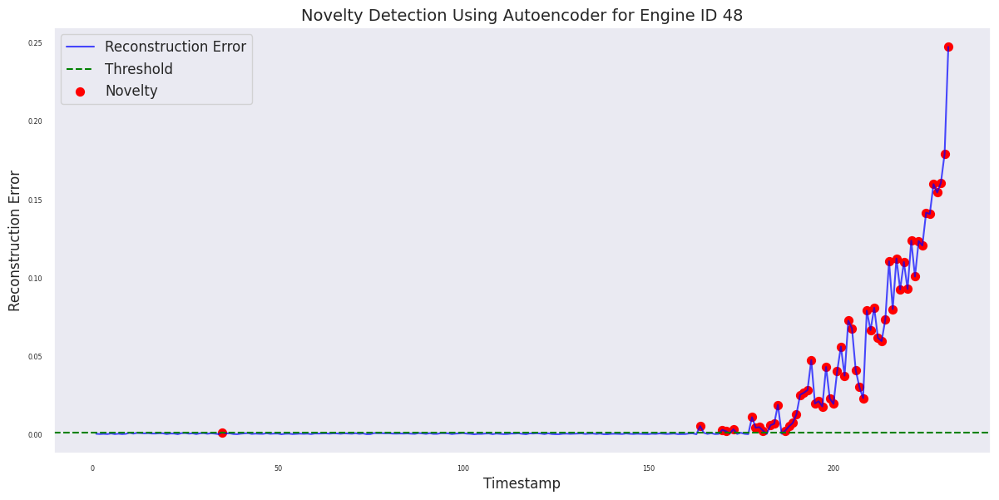

In [35]:
# Visualize novelty detection for a specific engine
engine_id = 48  # Replace with the desired engine ID
engine_data = filtered_train_data[filtered_train_data['unit_number'] == engine_id]

plt.figure(figsize=(12, 6))
plt.plot(engine_data['timestamp'], reconstruction_error[filtered_train_data['unit_number'] == engine_id], label='Reconstruction Error', color='blue', alpha=0.7)
plt.axhline(y=threshold, color='green', linestyle='--', label='Threshold')
plt.scatter(
    engine_data['timestamp'][engine_data['novelty']],
    reconstruction_error[filtered_train_data['unit_number'] == engine_id][engine_data['novelty']],
    color='red', label='Novelty', s=50
)
plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Reconstruction Error', fontsize=12)
plt.title(f'Novelty Detection Using Autoencoder for Engine ID {engine_id}', fontsize=14)
plt.legend(fontsize=12)
plt.grid()
plt.tight_layout()
plt.show()
